<center><h1><u><font color="#1b5776"><b>400 Birds Species Classification<b/></font></u></h1></center>

# <font color="#1b5776">1. <u>Introduction</u></font>

This is essentially a Kaggle dataset called [400 Bird Species - Classification](https://www.kaggle.com/gpiosenka/100-bird-species) and the owner of this dataset is Gerry. The aim of this case study is to perform a classification task between multiple species of birds provided in the dataset.

# <font color="#1b5776">2. <u>Business Problem</u></font>







## <font color="#1b5776">2.1. <u>Problem Statement</u></font>

* These kinds of problems are important for bodies like Forest Departments, or for people who are involved in the study of varied flora & fauna throughout the day. 
* As per [this resource](https://ourworldindata.org/birds#how-many-bird-species-are-there) in Our World in Data, apparently, there are more than 11000 different species of birds that have been discovered till now.
* Now for humans, it becomes really difficult to see & analyze which species a bird belongs to, especially when there arise situations of dealing with very rare species. This is where machines/computer comes to the rescue.
* This dataset contains 400 different species of birds in total. The task is to use an algorithm to train a machine about all these varied species so as to reduce the need for human interference as much as possible.


## <font color="#1b5776">2.2. <u>Business Constraints</u></font>

* No strict latency constraints: since any research is a well-defined process. Nobody would rush in the identification of a species. But yes, it shouldn’t be like, the training is taking weeks/months altogether. Taking days is well n good, but if the training takes hours, then it is best. But yes, the prediction by a trained model should be fast enough, preferable in milli-second or seconds range.
* Interpretability is good to have: we can use the probability with which the machine thinks that a particular bird belongs to species “A” to understand what the machine thinks.
* Model simplicity: Species classification kind of stuff is mainly used in research-based activities. Our model will be used in proper systems made for research. And hence, even if the model is a bit heavy it will be fine.
* Minimize Multi-Class error: Although this is not a problem where there are some life-threatening chances in case of incorrect prediction by the model, but it's still good to have as low multi-class error as possible.

# <font color="#1b5776">3. <u>Machine Learning Problem</u></font>

## <font color="#1b5776">3.1. <u>Data</u></font>

* This dataset contains 62388 images (in jpg format) of birds in total.
* These are subdivided into 3 separate directories → one for 58388 training images, one for 2000 test images, and one for 2000 validation images. Both test & validation directories have 5 images per species).
* All the images are of shape 224x224x3 → i.e. all images are in RGB format (i.e. having Red, Green & Blue channels).
* Each set (train, validation, test)has 400 directories for 400 different species.
* Every species (directory here) has at least 120 images of its type.
* There are no duplicate images since the owner has carefully removed any duplicates.
* Every image is such that the bird occupies at least 50% of the entire image.
* Every image file is sequentially numbered from 1 or 001.

## <font color="#1b5776">3.2. <u>Mapping the Real World problem to an ML problem</u></font>
* Type of problem → Multi-Class Classification task
* What we need to classify → Different species of birds from the 400 different species of birds provided.
* What we have as our target/class labels → the 400 different directory names indicate the 400 different species (our target variable)

## <font color="#1b5776">3.3. <u>Performance Metric</u></font>
* My initial investigation of this dataset shows that this dataset is imbalanced. All species(classes) have at least 120 images and some have a few more (like 140,160) and some have 240 images.
* Categorical-Crossentropy ➡ Our business constraint demands that our model gives some sense of probability of its prediction. And hence, we can leverage this to compute categorical-crossentropy loss. Since this is a multi-class classification, the model needs to optimize using the “categorical-cross-entropy” loss which is a multi-class log-loss equivalent for this multi-class classification task. And the log-loss as we all know, is a very good metric onto itself.
* So, Categorical-Crossentropy is the metric we'll use here.




# <font color="#1b5776">4. <u>Adding Imports</u></font>

## <font color="#1b5776">4.1. <u>Getting the Data</u></font>

In [ ]:
# !pip install kaggle (in case kaggle isn't installed)
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# getting all datasets using Kaggle API
# all these are in zipped state
!kaggle datasets download -d gpiosenka/100-bird-species

100% 1.49G/1.49G [00:11<00:00, 136MB/s]
100% 1.49G/1.49G [00:11<00:00, 142MB/s]


In [ ]:
# unzipping the entire dataset
!unzip /content/100-bird-species.zip

## <font color="#1b5776">4.2. <u>Getting relevant Libraries and Methods</u></font>

In [ ]:
import os
import pandas as pd
import numpy as np
from numpy.random import seed
import matplotlib.pyplot as plt
import seaborn as sns
import random
from matplotlib.image import imread
from tqdm import tqdm
import pickle
import shutil

import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.utils import plot_model,set_random_seed
from tensorflow.keras.backend import clear_session

from tensorflow.keras.models import Model,load_model
from tensorflow.keras.layers import Input,Conv2D,MaxPooling2D,Flatten,Dense,Dropout,DepthwiseConv2D,BatchNormalization,Concatenate,Add,Activation,SeparableConv2D,GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras.callbacks import ReduceLROnPlateau,ModelCheckpoint,TensorBoard,LearningRateScheduler,EarlyStopping
from tensorflow.keras.regularizers import L1,L2,L1L2
from tensorflow.keras.optimizers import Adam,SGD
%load_ext tensorboard

from tensorflow.keras.applications import VGG16,ResNet50,InceptionV3,EfficientNetB0,VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_prep
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_prep
from tensorflow.keras.applications.inception_v3 import preprocess_input as incep_prep
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_prep
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_prep

from prettytable import PrettyTable
import cv2
from google.colab.patches import cv2_imshow

# <font color="#1b5776">5. <u>EDA</u></font>

In [ ]:
def get_counts(dataset_path,dataset_type):
  """Takes dataset's folder path and returns some basic details like species count, images count, height, width etc."""
  all_species_count = len(os.listdir(dataset_path))
  all_species_names=[]
  species_image_count=[]
  all_heights=[]
  all_widths=[]
  for i in tqdm(os.listdir(dataset_path)):
    all_species_names.append(i)
    species_folder_path = dataset_path + "/" + i + "/"
    species_image_count.append(len(os.listdir(species_folder_path)))
    for j in os.listdir(species_folder_path):
      filename = species_folder_path + j
      image = imread(filename)
      all_heights.append(image.shape[0])
      all_widths.append(image.shape[1])
  print()
  print(f"Total no. of species in {dataset_type}= {all_species_count}")
  return all_species_names,species_image_count,all_heights,all_widths

### <b><font color="orange">Train</font></b>

In [ ]:
# TRAIN
train_species_names,train_species_image_count,train_images_heights,train_images_widths = get_counts(dataset_path="/content/train/",dataset_type="train")

100%|██████████| 400/400 [01:09<00:00,  5.76it/s]


Total no. of species in train= 400


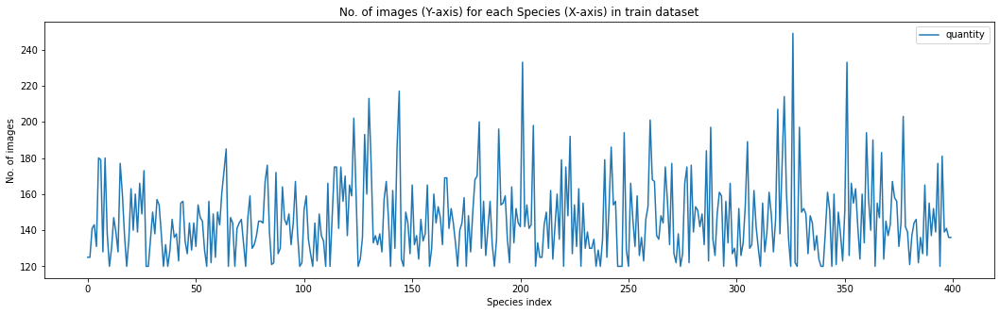

In [ ]:
# Using the indices 0-384 as x-axis since displaying 399 species names will make the plot cumbersome to read:-
df = pd.DataFrame({"species_name":train_species_names,
                   "quantity":train_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in train dataset",ylabel="No. of images",xlabel="Species index")

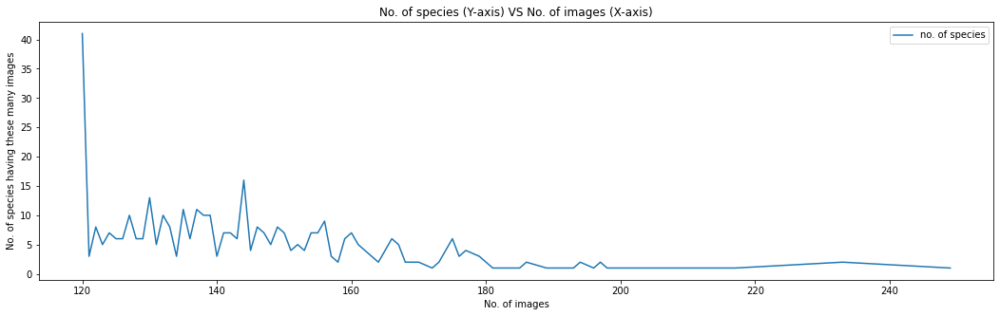

In [ ]:
df2 = df.groupby(by="quantity").count().reset_index().rename(columns={"species_name":"no. of species"})
df2.plot(kind="line",x="quantity",y="no. of species",figsize=(18,5),
         title="No. of species (Y-axis) VS No. of images (X-axis)",xlabel="No. of images",ylabel="No. of species having these many images")

<font color="red">CONCLUSION</font>:-
* Most of the classes(species here) have 120 images. Rest have around 140-240. 
* There are very few classes (around 1-2) which have above 200-240 data points (i.e. images). This dataset is fairly imbalanced.

Text(0.5, 0, 'Width')

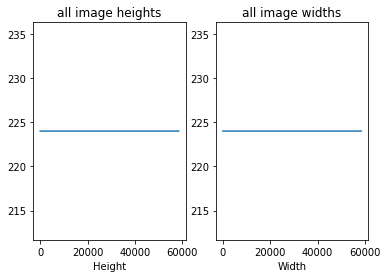

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=train_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=train_images_widths)
plt.title("all image widths")
plt.xlabel("Width")

<font color='red'>CONCLUSIONS</font> ➡ All images have height=224 & width=224 in train folder.

### <b><font color="orange">Validation</font></b>

In [ ]:
# VALIDATION
val_species_names,val_species_image_count,val_images_heights,val_images_widths = get_counts(dataset_path="/content/valid",dataset_type="validation")

100%|██████████| 400/400 [00:02<00:00, 158.65it/s]


Total no. of species in validation= 400


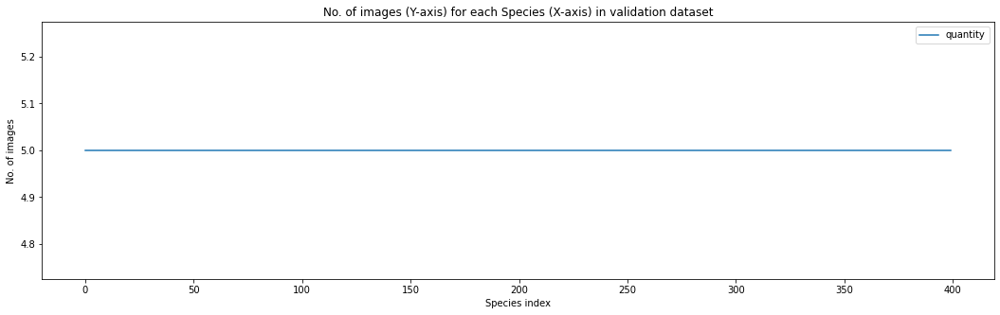

In [ ]:
df = pd.DataFrame({"species_name":val_species_names,
                   "quantity":val_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in validation dataset",ylabel="No. of images",xlabel="Species index")

<font color='red'>CONCLUSIONS</font> ➡ Every species has at 5 images in validation folder.

In [ ]:
# df2 = df.groupby(by="quantity").count().reset_index().rename(columns={"species_name":"no. of species"})
# df2.plot(kind="line",x="quantity",y="no. of species",figsize=(18,5),
#          title="No. of species (Y-axis) VS No. of images (X-axis)",xlabel="No. of images",ylabel="No. of species having these many images")

Text(0.5, 0, 'Width')

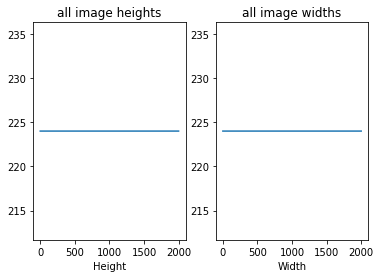

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=val_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=val_images_widths)
plt.title("all image widths")
plt.xlabel("Width")

<font color='red'>CONCLUSIONS</font>:-
All images have height=224 & width=224 in validation folder.

### <b><font color="orange">Test</font></b>

In [ ]:
# TEST
test_species_names,test_species_image_count,test_images_heights,test_images_widths = get_counts(dataset_path="/content/test",dataset_type="test")

100%|██████████| 400/400 [00:02<00:00, 158.73it/s]


Total no. of species in test= 400


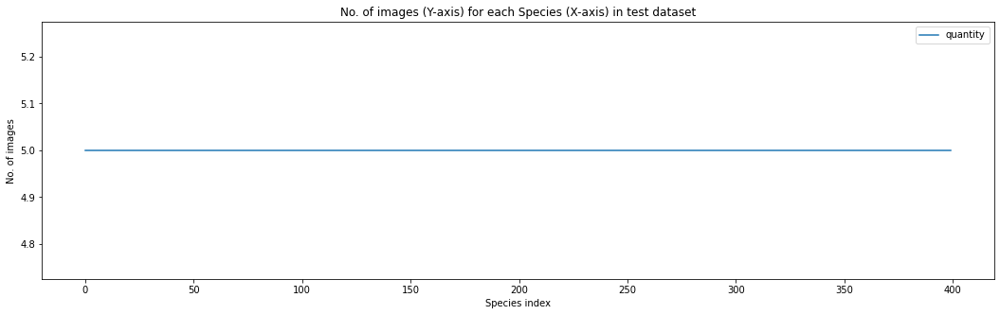

In [ ]:
df = pd.DataFrame({"species_name":test_species_names,
                   "quantity":test_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in test dataset",ylabel="No. of images",xlabel="Species index")

<font color='red'>CONCLUSIONS</font> ➡ Every species has at 5 images in test folder.

In [ ]:
# df2 = df.groupby(by="quantity").count().reset_index().rename(columns={"species_name":"no. of species"})
# df2.plot(kind="line",x="quantity",y="no. of species",figsize=(18,5),
#          title="No. of species (Y-axis) VS No. of images (X-axis)",xlabel="No. of images",ylabel="No. of species having these many images")

Text(0.5, 0, 'Width')

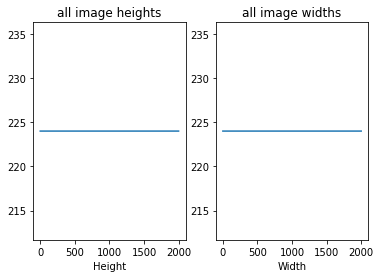

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=test_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=test_images_widths)
plt.title("all image widths")
plt.xlabel("Width")

<font color='red'>CONCLUSIONS</font>:-
All images have height=224 & width=224 in test.

### <b><font color="orange">Combined Examination</font></b>

In [ ]:
check = sorted(train_species_names) == sorted(val_species_names) == sorted(test_species_names)
print("Are all species names same in train, validation & test datasets? -->",check)

Are all species names same in train, validation & test datasets? --> False


<font color="red">CONCLUSION</font>:-
There is/are some species name which is/are not same in all 3 folders. Let's check which one(s):-

In [ ]:
for i in train_species_names:
  if (i not in val_species_names) or (i not in test_species_names):
    print(i)

BLACK & YELLOW  BROADBILL


In [ ]:
print("Performing set difference by subtracting the validation species names from train:-")
set(train_species_names).difference(set(val_species_names))

Performing set difference by subtracting the validation species names from train:-


{'BLACK & YELLOW  BROADBILL'}

In [ ]:
print("Performing set difference by subtracting the train species names from validation:-")
set(val_species_names).difference(set(train_species_names))

Performing set difference by subtracting the train species names from validation:-


{'BLACK & YELLOW BROADBILL'}

In [ ]:
print("Performing set difference by subtracting the train species names from test:-")
set(test_species_names).difference(set(train_species_names))

Performing set difference by subtracting the train species names from test:-


{'BLACK & YELLOW BROADBILL'}

<font color="red">CONCLUSION</font>:-
The species "BLACK & YELLOW BROADBILL" name has got an extra space in train dataset. We have to rename it by reducing the extra space before BROADBILL.

In [ ]:
os.rename(src="/content/train/BLACK & YELLOW  BROADBILL",dst="/content/train/BLACK & YELLOW BROADBILL")

In [ ]:
check = sorted(os.listdir("/content/train/")) == sorted(os.listdir("/content/valid/")) == sorted(os.listdir("/content/test/"))
print("Are all species names same in train, validation & test datasets now? -->",check)

Are all species names same in train, validation & test datasets now? --> True


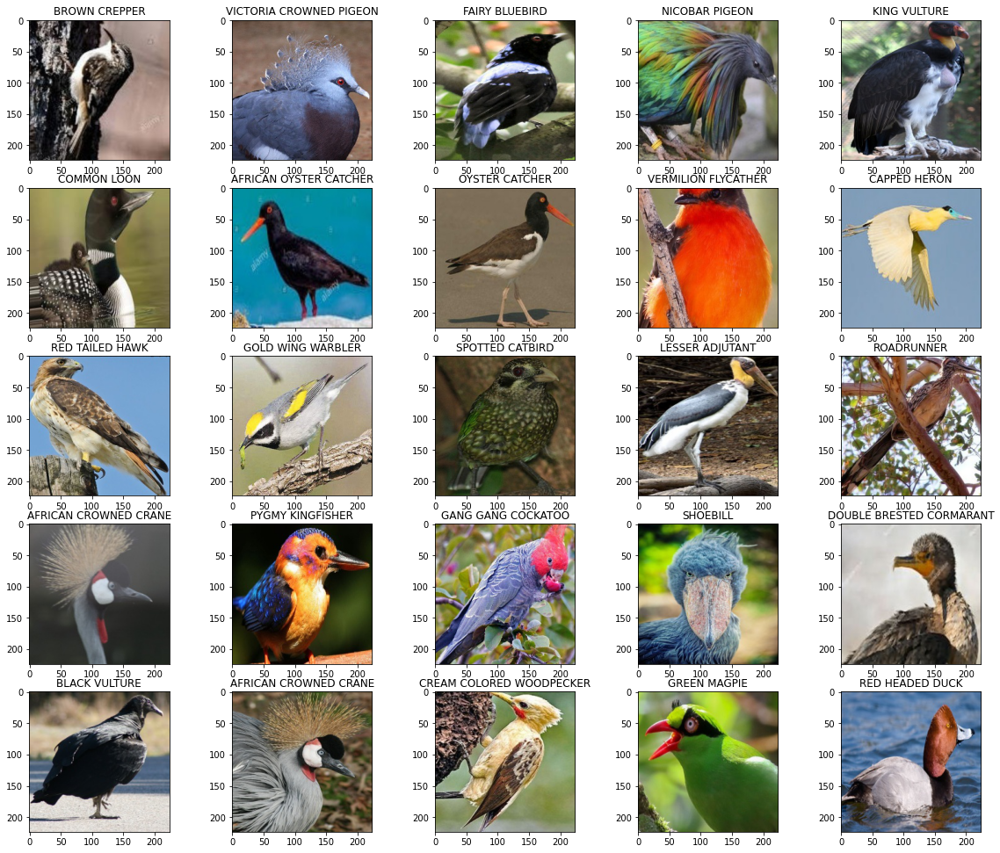

In [ ]:
# PRINT SOME RANDOMLY SELECTED 25 IMAGES FROM THE TRAIN FOLDER
parent_dir = "/content/train/"
all_subdirs = os.listdir(parent_dir)

plt.subplots(figsize=(20,17))

for col in range(1,26):
  plt.subplot(5,5,col)
  chosen_species_dir = all_subdirs[random.randint(0,349)]
  chosen_dir = parent_dir + chosen_species_dir
  all_images_in_chosen_dir = os.listdir(chosen_dir)
  chosen_img = chosen_dir + "/" + all_images_in_chosen_dir[random.randint(0,len(all_images_in_chosen_dir)-1)]
  image = imread(chosen_img)
  plt.title(chosen_species_dir)
  plt.imshow(image)

<font color='red'>CONCLUSIONS</font>:-
* All the images are RGB & occupy at least 50% of the entire 224x224 image. This has been mentioned by the owner of this dataset as well.
* This will help the model to grasp most of the valuable details of every image.

# <font color="#1b5776">6. <u>Creating Data Pipeline</u></font>

## <font color="#1b5776">6.1. <u>Testing different Image Augmentations</u></font>
Let's first examine how some augmentations make our images look and which among these will be suitable for our problem.
Performing augmentation is very important since it helps to artificially increase the train dataset size and helps the model to learn these additional images as well, thus reducing overfitting on train images and reducing generalisation error.

In [ ]:
def get_augmented_sample(datagen):
  it = datagen.flow(img,batch_size=1)
  plt.figure(figsize=(20,5))
  for i in range(1,6):
    plt.subplot(1,5,i)
    # valid range for matplotlib imshow with RGB data --> ([0..1] for floats or [0..255] for integers) 
    # Hence, we need to convert the image array to uint8
    # uint8 is an unsigned 8-bit integer that can represent values 0.. 255
    plt.imshow(it.next()[0].astype('uint8'))
  plt.show()

The Actual Image


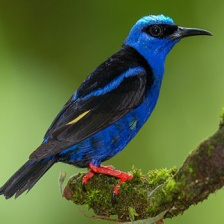

In [ ]:
# SAMPLE IMAGE --> a RED HONEY CREEPER
path = "/content/train/RED HONEY CREEPER/013.jpg"

sample = load_img(path=path)
img = np.expand_dims(sample,0)
print("The Actual Image")
sample

### <b><font color="#7be61a">-----<font color="#8f0dea">Width Shifts</font>-----</font><b>

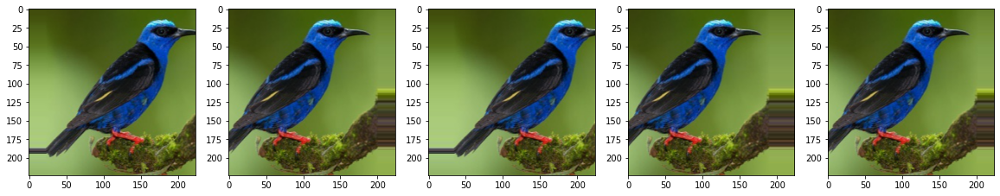

In [ ]:
dgen = ImageDataGenerator(width_shift_range=[0.1,0.15,0.2,0.25])
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Height Shifts</font>-----</font><b>

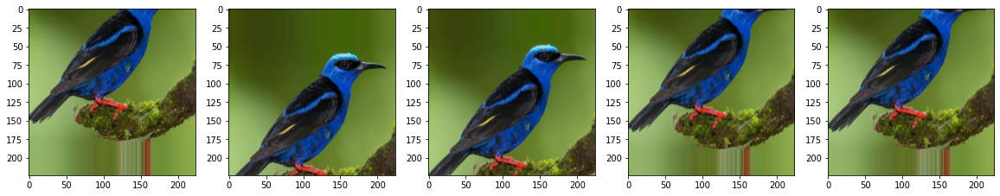

In [ ]:
dgen = ImageDataGenerator(height_shift_range=[0.1,0.15,0.2,0.25])
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Random Rotations</font>-----</font><b>

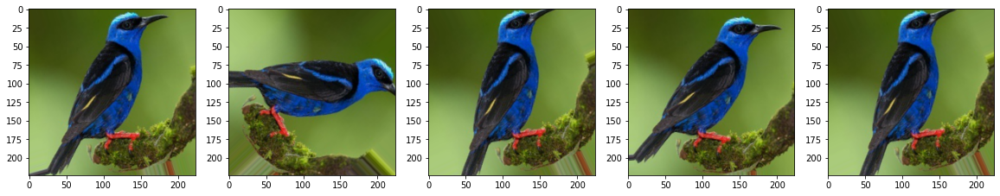

In [ ]:
dgen = ImageDataGenerator(rotation_range=60)
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Random Brightness (darkening/lightening)</font>-----</font><b>
Values < 1 darken the image; Values > 1 brighten the image ; Value=1 doesn't change anything

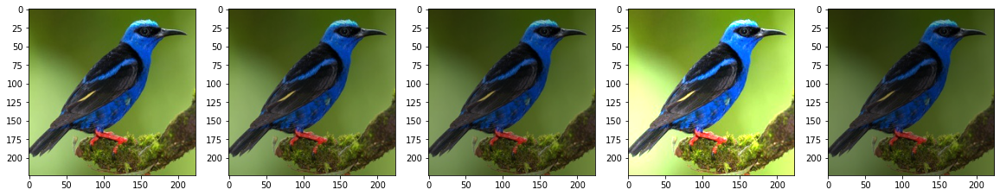

In [ ]:
dgen = ImageDataGenerator(brightness_range=[0.5,1.9])
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Horizontal Flipping</font>-----</font><b>

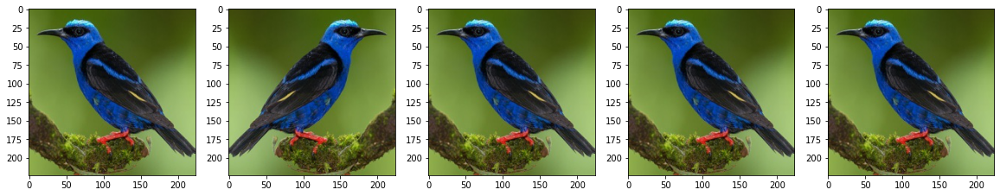

In [ ]:
dgen = ImageDataGenerator(horizontal_flip=True)
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Vertical Flipping</font>-----</font><b>

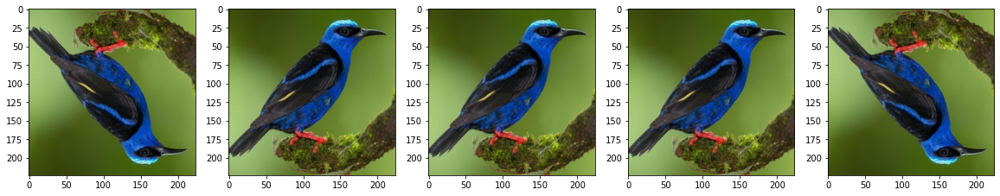

In [ ]:
dgen = ImageDataGenerator(vertical_flip=True)
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Shearing</font>-----</font><b>

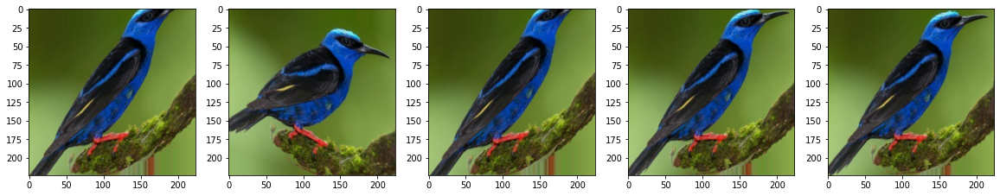

In [ ]:
dgen = ImageDataGenerator(shear_range=45)
get_augmented_sample(dgen)

### <b><font color="#7be61a">-----<font color="#8f0dea">Random Zoom</font>-----</font><b>

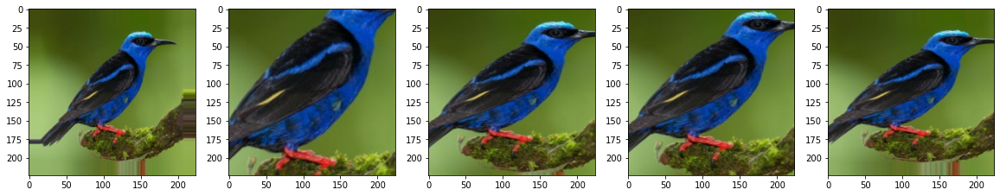

In [ ]:
dgen = ImageDataGenerator(zoom_range=[0.6,1.2])
get_augmented_sample(dgen)

## <font color="#1b5776">6.2. <u>Creating Data Generators with/without Real-time image Augmentation</u></font>

###### <font color="red">A SIMPLE IMAGE DATA GENERATOR WITHOUT ANY AUGMENTATION; JUST SCALING PIXELS WITHIN 0-1</font>

In [ ]:
datagen1 = ImageDataGenerator(rescale=1/255)

###### <font color="red">A MORE COMPLEX IMAGE DATA GENERATOR WITH DIFFERENT KINDS OF AUGMENTATION ALONG WITH PIXEL SCALING LIKE ABOVE.
NOTE --> THIS WILL BE ONLY USED FOR TRAINING DATASET</font>

In [ ]:
datagen2 = ImageDataGenerator(rescale=1/255,width_shift_range=[0.1,0.15,0.2,0.25],height_shift_range=[0.1,0.15,0.2,0.25],
                              rotation_range=60,brightness_range=[0.5,1.9],horizontal_flip=True,shear_range=45,zoom_range=[0.6,1.2])

###### <font color="red">NON-TRANSFER LEARNING ITERATOR</font>
CREATING DIFFERENT ITERATORS USING DIFFERENT DATA GENERATORS

In [ ]:
def non_transfer_learning_iterator(batch_size,img_w,img_h,train_iterator_type):
  BATCH_SIZE=batch_size
  TARGET_SIZE=(img_w,img_h)

  path1 = "/content/train"
  path2 = "/content/valid"
  path3 = "/content/test"

  # VALIDATION,TEST ITERATORS
  validation_it = datagen1.flow_from_directory(path2,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  test_it = datagen1.flow_from_directory(path3,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  
  # TRAIN ITERATOR WITH/WITHOUT AUGMENTATION
  if train_iterator_type=="1":  # won't augment
    train_it = datagen1.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  elif train_iterator_type=="2":  # will augment
    train_it = datagen2.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  
  return train_it,validation_it,test_it

###### <font color="red">TRANSFER LEARNING ITERATOR</font>
ANOTHER IMAGE DATA GENERATOR WITH AUGMENTATION; PIXEL SCALING; AND A PREPROCESSING FUNCTION SPECIFC TO THE PRE-DEFINED MODEL BEING TRAINED
NOTE --> ONLY TRAIN SET WILL BE AUGMENTED HERE AS WELL. AND THE PRE-PROCESSING FUNC WILL BE APPLIED TO ALL IMAGES WITH RECSALING

In [ ]:
def transfer_learning_iterator(prep_func,batch_size,img_w,img_h,aug=False):
  """Returns separate image data generators for train and validation/test sets for different transfer learning approaches.
  This function will be called when transfer learning will be done."""
  BATCH_SIZE=batch_size
  TARGET_SIZE=(img_w,img_h)
  path1 = "/content/train"
  path2 = "/content/valid"
  path3 = "/content/test"
  
  datagen = ImageDataGenerator(rescale=1/255,preprocessing_function=prep_func)  # no augmentation will be performed

  # VALIDATION,TEST ITERATORS
  validation_it = datagen.flow_from_directory(path2,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  test_it = datagen.flow_from_directory(path3,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)

  if aug==True:
    datagen = ImageDataGenerator(rescale=1/255,width_shift_range=[0.1,0.15,0.2,0.25],height_shift_range=[0.1,0.15,0.2,0.25],
                                 rotation_range=60,brightness_range=[0.5,1.9],horizontal_flip=True,shear_range=45,zoom_range=[0.6,1.2],
                                 preprocessing_function=prep_func)
  
  train_it = datagen.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)  
    
  return train_it,validation_it,test_it

# <font color="#1b5776">7. <u>Deep Learning Models</u></font>

### <b><font color="#8fce00">Re-usable function to visualize model's predictions</font></b>

In [ ]:
def predict_bird_species(img_path,img_width,img_height,actual_species_name,best_model,tf_lr=False,prep_func=None):
  """This function helps us to visualize the model's predictions a.k.a thoughts"""
  plt.subplots(figsize=(20,5))

  # load the image
  img = load_img(img_path, target_size=(img_width,img_height))  # (img_width,img_height,3)

  plt.subplot(1,6,1)
  title_text = "Actual Species:",actual_species_name
  plt.title(title_text,fontsize=8)
  plt.imshow(img)

  # convert to array
  img = img_to_array(img) # (img_width,img_height,3)

  # modify as per the pre-defined model being fed
  if tf_lr == True:
    img = prep_func(img)

  # add batch size as a dimension 
  img = np.expand_dims(img, axis=0)  #(1,img_width,img_height,3)

  prediction_probability = best_model.predict(img)
  sorted_preds = np.sort(prediction_probability)[0][::-1]
  top5preds = np.argsort(prediction_probability)[0][::-1][:5]

  all_species = {v:k for k,v in train_it.class_indices.items()}
  print("Top 5 species & the probabilities with which the model thinks that this bird belongs to:-")
  for i in range(len(top5preds)):
    pred_species = all_species.get(top5preds[i])
    other_img = load_img("/content/test/"+pred_species+"/1.jpg", target_size=(img_width,img_height))

    plt.subplot(1,6,i+2)
    title_text = pred_species + ":" + str(sorted_preds[i])
    plt.title(title_text,fontsize=8)
    plt.imshow(other_img)

### <b><font color="#8fce00">Model-1</font></b>
* Image dimensions: 96x96
* No augmentation
* 2 x (Conv + Pooling) block Separable Convolutions
* Flatten + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=96,96
BATCH_SIZE = 256
train_it,validation_it,test_it = non_transfer_learning_iterator(batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,train_iterator_type="1")
model_id="1"

input_layer = Input(shape=(img_width,img_height,3), name="main_input_layer")
conv = SeparableConv2D(filters=256,kernel_size=(3,3), padding='same',depth_multiplier=1,activation="relu",use_bias=True,
                       depthwise_initializer='he_uniform',pointwise_initializer='he_uniform',bias_initializer='zeros')(input_layer)
mpool = MaxPooling2D(pool_size=(2,2))(conv)
conv = SeparableConv2D(filters=256,kernel_size=(3,3), padding='same',depth_multiplier=1,activation="relu",use_bias=True,
                       depthwise_initializer='he_uniform',pointwise_initializer='he_uniform',bias_initializer='zeros')(mpool)
mpool = MaxPooling2D(pool_size=(2,2))(conv)
flat = Flatten()(mpool)
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(flat)
output_layer = Dense(units=400,activation="softmax")(dense)

model1 = Model(inputs=input_layer,outputs=output_layer)
model1.compile(optimizer="adam",loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=2,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model1.fit(train_it,steps_per_epoch=len(train_it),
                    validation_data=validation_it,validation_steps=len(validation_it),
                    epochs=20,callbacks=[cb1,cb2,cb3])

Epoch 1/20
229/229 [==============================] - ETA: 0s - loss: 5.9845
Epoch 1: val_loss improved from inf to 5.91529, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/save_model/weights-01-5.9153.h5
229/229 [==============================] - 98s 426ms/step - loss: 5.9845 - val_loss: 5.9153
Epoch 2/20
229/229 [==============================] - ETA: 0s - loss: 5.7031
Epoch 2: val_loss improved from 5.91529 to 5.31588, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/save_model/weights-02-5.3159.h5
229/229 [==============================] - 90s 393ms/step - loss: 5.7031 - val_loss: 5.3159
Epoch 3/20
229/229 [==============================] - ETA: 0s - loss: 4.9561
Epoch 3: val_loss improved from 5.31588 to 4.39902, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/save_model/weights-03-4.3990.h5
229/229 [======================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model1.evaluate(test_it)

Loss on Completely unseen test dataset:-
8/8 [==============================] - 3s 343ms/step - loss: 3.2695


3.2695488929748535

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


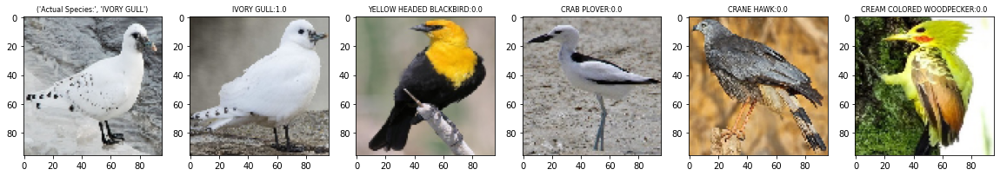

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/save_model/weights-09-3.3087.h5")

predict_bird_species(img_path="/content/test/IVORY GULL/4.jpg",img_width=96,img_height=96,
                     actual_species_name="IVORY GULL",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


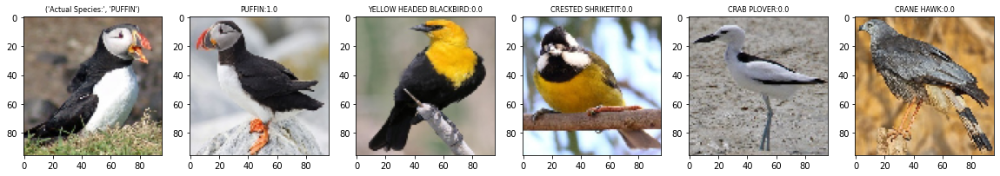

In [ ]:
predict_bird_species(img_path="/content/test/PUFFIN/3.jpg",img_width=96,img_height=96,
                     actual_species_name="PUFFIN",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


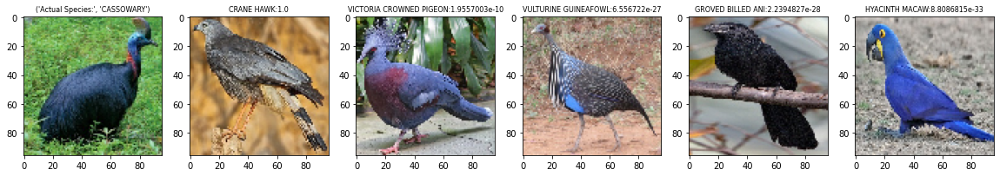

In [ ]:
predict_bird_species(img_path="/content/test/CASSOWARY/1.jpg",img_width=96,img_height=96,
                     actual_species_name="CASSOWARY",best_model=m)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/tblogs/"

                                                       Epoch Loss


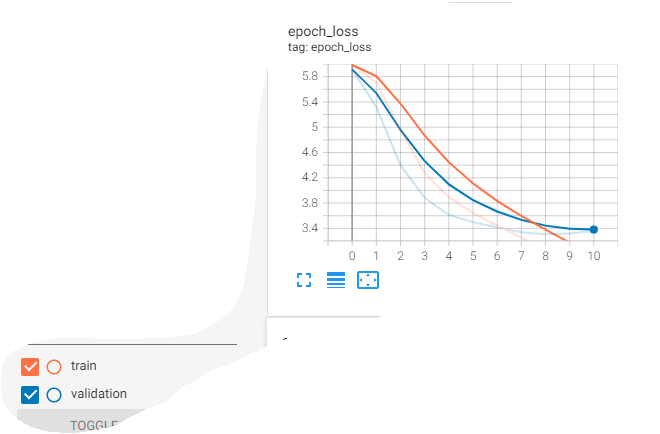

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-2</font></b>
* Image dimensions: 32x32
* With Augmentation
* 2 x (2xConv + Pooling) blocks
* GlobalMaxPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=32,32
BATCH_SIZE = 256
train_it,validation_it,test_it = non_transfer_learning_iterator(batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,train_iterator_type="2")
model_id="2"

input_layer = Input(shape=(img_width,img_height,3), name="main_input_layer")
conv = Conv2D(filters=32,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(input_layer)
conv = Conv2D(filters=32,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(conv)                       
mpool = MaxPooling2D(pool_size=(2,2))(conv)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(mpool)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(conv)                       
glob = GlobalMaxPooling2D()(conv)
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(glob)
output_layer = Dense(units=400,activation="softmax")(dense)

model2 = Model(inputs=input_layer,outputs=output_layer)
model2.compile(optimizer="adam",loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=3,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model2.fit(train_it,steps_per_epoch=len(train_it),
                    validation_data=validation_it,validation_steps=len(validation_it),
                    epochs=30,callbacks=[cb1,cb2,cb3])

Epoch 1/30
229/229 [==============================] - ETA: 0s - loss: 5.5196
Epoch 1: val_loss improved from inf to 4.80272, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-2/save_model/weights-01-4.8027.h5
229/229 [==============================] - 124s 537ms/step - loss: 5.5196 - val_loss: 4.8027
Epoch 2/30
229/229 [==============================] - ETA: 0s - loss: 4.7739
Epoch 2: val_loss improved from 4.80272 to 4.16626, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-2/save_model/weights-02-4.1663.h5
229/229 [==============================] - 122s 532ms/step - loss: 4.7739 - val_loss: 4.1663
Epoch 3/30
229/229 [==============================] - ETA: 0s - loss: 4.4017
Epoch 3: val_loss improved from 4.16626 to 3.76799, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-2/save_model/weights-03-3.7680.h5
229/229 [====================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model2.evaluate(test_it)

Loss on Completely unseen test dataset:-
8/8 [==============================] - 3s 373ms/step - loss: 2.0766


2.0766055583953857

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


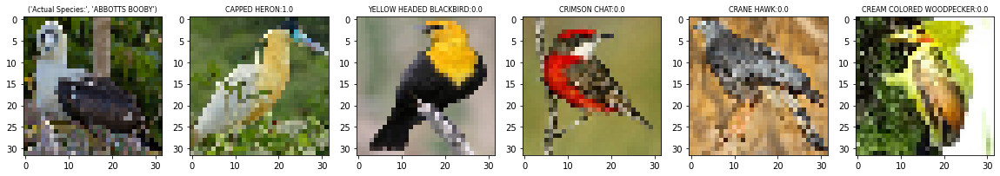

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-2/save_model/weights-23-2.2306.h5")

predict_bird_species(img_path="/content/test/ABBOTTS BOOBY/2.jpg",img_width=32,img_height=32,
                     actual_species_name="ABBOTTS BOOBY",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


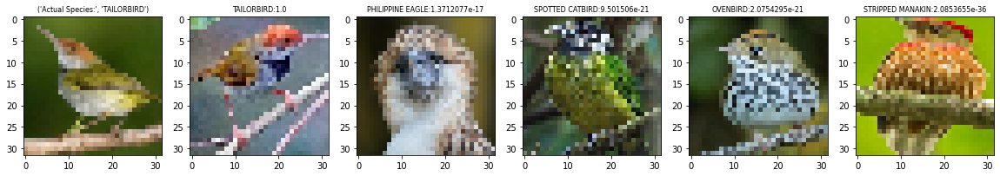

In [ ]:
predict_bird_species(img_path="/content/test/TAILORBIRD/3.jpg",img_width=32,img_height=32,
                     actual_species_name="TAILORBIRD",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


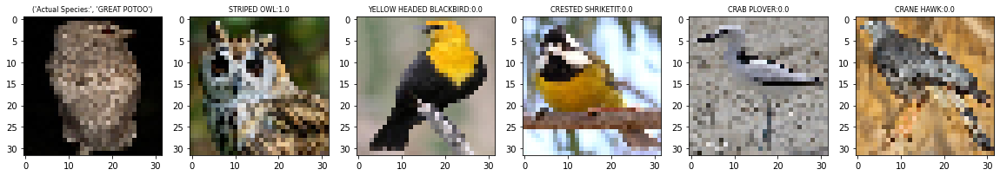

In [ ]:
predict_bird_species(img_path="/content/test/GREAT POTOO/1.jpg",img_width=32,img_height=32,
                     actual_species_name="GREAT POTOO",best_model=m)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-2/tblogs/"

                                                       Epoch Loss


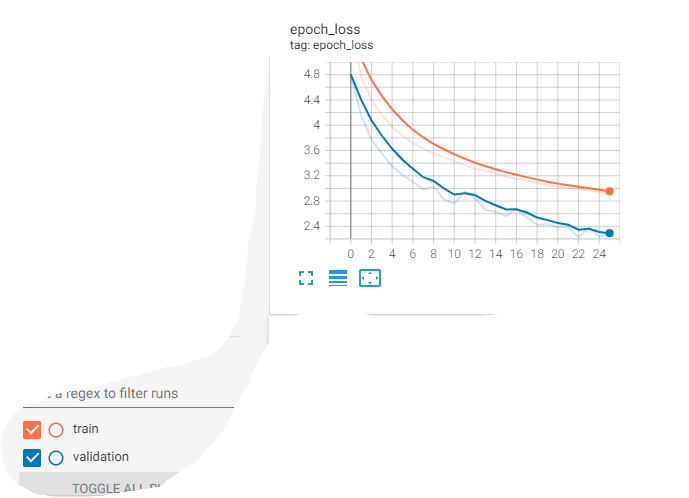

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-3</font></b>
* Image dimensions: 128x128
* No Augmentation
* Dropout
* 3 x (2xConv + Pooling) blocks
* GlobalMaxPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=128,128
BATCH_SIZE=512
train_it,validation_it,test_it = non_transfer_learning_iterator(batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,train_iterator_type="1")
model_id="3"

input_layer = Input(shape=(img_width,img_height,3), name="main_input_layer")
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(input_layer)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(conv)                       
mpool = MaxPooling2D(pool_size=(2,2))(conv)
drp = Dropout(rate=0.3)(mpool)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(drp)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(conv)                       
mpool = MaxPooling2D(pool_size=(2,2))(conv)
drp = Dropout(rate=0.3)(mpool)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(drp)
conv = Conv2D(filters=64,kernel_size=(3,3), padding='same',activation="relu",use_bias=True,kernel_initializer='he_uniform')(conv)                       
glob = GlobalMaxPooling2D()(conv)
dense = Dense(units=64,activation="relu",kernel_initializer="he_uniform")(glob)
drp = Dropout(rate=0.3)(dense)
dense = Dense(units=64,activation="relu",kernel_initializer="he_uniform")(drp)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

model3 = Model(inputs=input_layer,outputs=output_layer)
model3.compile(optimizer="adam",loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model3.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=50,callbacks=[cb1,cb2,cb3])

Epoch 1/50
115/115 [==============================] - ETA: 0s - loss: 6.0506
Epoch 1: val_loss improved from inf to 5.98259, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-3/save_model/weights-01-5.9826.h5
115/115 [==============================] - 94s 769ms/step - loss: 6.0506 - val_loss: 5.9826
Epoch 2/50
115/115 [==============================] - ETA: 0s - loss: 5.8295
Epoch 2: val_loss improved from 5.98259 to 5.67684, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-3/save_model/weights-02-5.6768.h5
115/115 [==============================] - 84s 725ms/step - loss: 5.8295 - val_loss: 5.6768
Epoch 3/50
115/115 [==============================] - ETA: 0s - loss: 5.4358
Epoch 3: val_loss improved from 5.67684 to 5.03037, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-3/save_model/weights-03-5.0304.h5
115/115 [======================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model3.evaluate(test_it)

Loss on Completely unseen test dataset:-
4/4 [==============================] - 3s 825ms/step - loss: 1.1641


1.1641032695770264

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


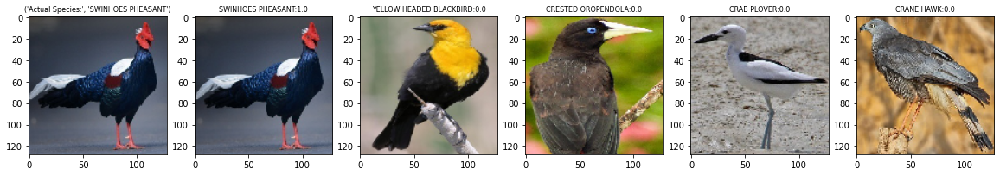

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-3/save_model/weights-48-1.2643.h5")

predict_bird_species(img_path="/content/test/SWINHOES PHEASANT/1.jpg",img_width=128,img_height=128,
                     actual_species_name="SWINHOES PHEASANT",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


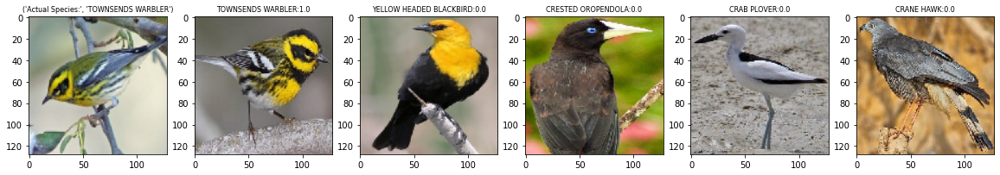

In [ ]:
predict_bird_species(img_path="/content/test/TOWNSENDS WARBLER/4.jpg",img_width=128,img_height=128,
                     actual_species_name="TOWNSENDS WARBLER",best_model=m)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


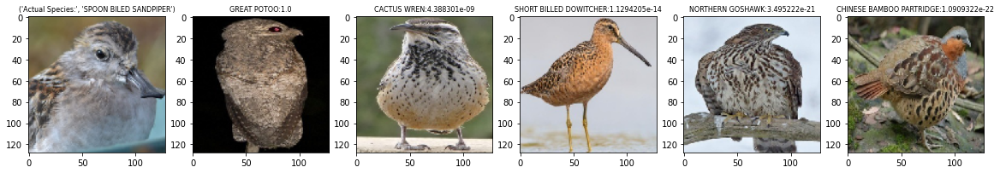

In [ ]:
predict_bird_species(img_path="/content/test/SPOON BILED SANDPIPER/1.jpg",img_width=128,img_height=128,
                     actual_species_name="SPOON BILED SANDPIPER",best_model=m)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-3/tblogs/"

                                                       Epoch Loss


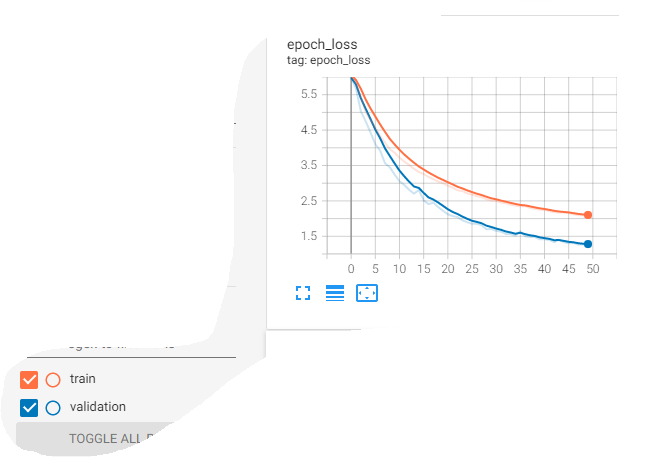

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-4</font></b>
* Trasfer Learning using VGG16 (without its top layers)
* Transfer Learning for Feature Extraction & Adding my own classifier in the end
* Adam with default Learning Rate = 0.001
* Image dimensions: 128x128
* No Augmentation
* With Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=128,128
BATCH_SIZE=256
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=vgg16_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height)
model_id="4"

input_layer = Input(shape=(img_width,img_height,3), name="main_input_layer")

# pre-trained model --> VGG16
model = VGG16(include_top=False,weights="imagenet",input_shape=(img_width,img_height, 3))
model.trainable = False

# our new classifier starts here
glob = GlobalAveragePooling2D()(model.layers[-1].output)
drp = Dropout(rate=0.4)(glob)
dense = Dense(units=1024,activation="relu",kernel_initializer="he_uniform")(drp)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model4 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model4.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model4.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
229/229 [==============================] - ETA: 0s - loss: 5.0554
Epoch 1: val_loss improved from inf to 3.26913, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-4/save_model/weights-01-3.2691.h5
229/229 [==============================] - 104s 448ms/step - loss: 5.0554 - val_loss: 3.2691
Epoch 2/100
229/229 [==============================] - ETA: 0s - loss: 3.4803
Epoch 2: val_loss improved from 3.26913 to 2.23844, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-4/save_model/weights-02-2.2384.h5
229/229 [==============================] - 102s 445ms/step - loss: 3.4803 - val_loss: 2.2384
Epoch 3/100
229/229 [==============================] - ETA: 0s - loss: 2.9774
Epoch 3: val_loss improved from 2.23844 to 1.88915, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-4/save_model/weights-03-1.8892.h5
229/229 [=================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model4.evaluate(test_it)

Loss on Completely unseen test dataset:-
8/8 [==============================] - 11s 857ms/step - loss: 0.8807


0.8806815147399902

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


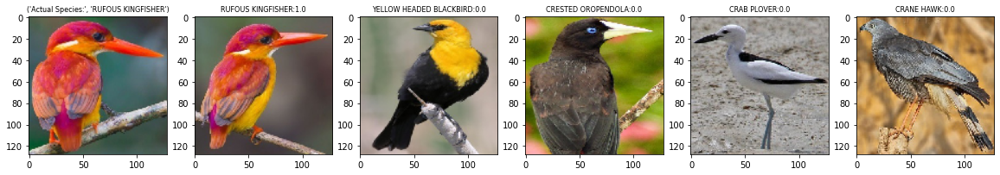

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-4/save_model/weights-47-0.9423.h5")

predict_bird_species(img_path="/content/test/RUFOUS KINGFISHER/5.jpg",img_width=128,img_height=128,
                     actual_species_name="RUFOUS KINGFISHER",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


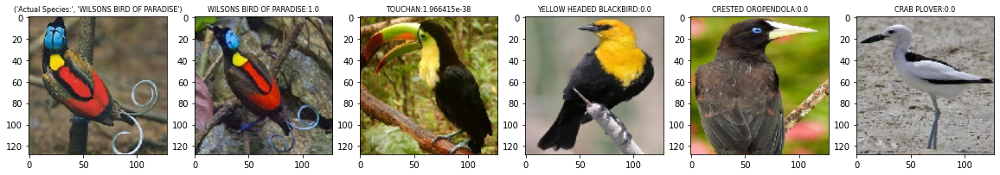

In [ ]:
predict_bird_species(img_path="/content/test/WILSONS BIRD OF PARADISE/2.jpg",img_width=128,img_height=128,
                     actual_species_name="WILSONS BIRD OF PARADISE",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


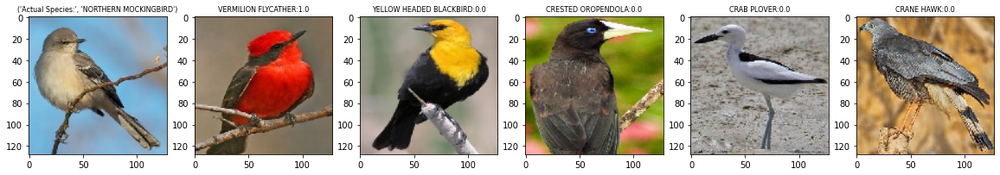

In [ ]:
predict_bird_species(img_path="/content/test/NORTHERN MOCKINGBIRD/1.jpg",img_width=128,img_height=128,
                     actual_species_name="NORTHERN MOCKINGBIRD",best_model=m,tf_lr=True,prep_func=vgg16_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-4/tblogs/"

                                                       Epoch Loss


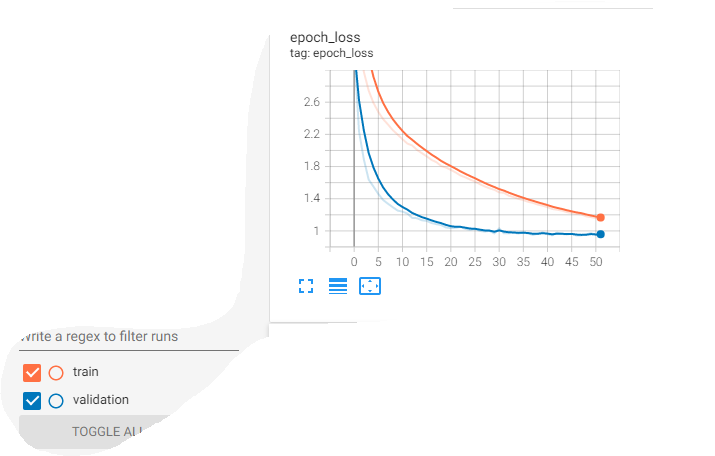

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-5</font></b>
* Trasfer Learning using VGG16 (without its top layers)
* Transfer Learning for Feature Extraction & Adding my own classifier in the end
* Adam with default Learning Rate = 0.001
* Image dimensions: 224x224
* With Augmentation
* No Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=64
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=vgg16_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,aug=True)
model_id="5"

# pre-trained model --> VGG16
model = VGG16(include_top=False,weights="imagenet",input_shape=(img_width,img_height, 3))
model.trainable = False

# our new classifier starts here
glob = GlobalAveragePooling2D()(model.layers[-1].output)
dense = Dense(units=1024,activation="relu",kernel_initializer="he_uniform")(glob)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model5 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model5.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model5.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=50,callbacks=[cb1,cb2,cb3])

Epoch 1/50
913/913 [==============================] - ETA: 0s - loss: 5.1137
Epoch 1: val_loss improved from inf to 3.51677, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-5/save_model/weights-01-3.5168.h5
913/913 [==============================] - 838s 915ms/step - loss: 5.1137 - val_loss: 3.5168
Epoch 2/50
913/913 [==============================] - ETA: 0s - loss: 3.9505
Epoch 2: val_loss improved from 3.51677 to 2.51219, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-5/save_model/weights-02-2.5122.h5
913/913 [==============================] - 848s 929ms/step - loss: 3.9505 - val_loss: 2.5122
Epoch 3/50
913/913 [==============================] - ETA: 0s - loss: 3.5095
Epoch 3: val_loss improved from 2.51219 to 2.07778, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-5/save_model/weights-03-2.0778.h5
913/913 [====================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model5.evaluate(test_it)

Loss on Completely unseen test dataset:-
32/32 [==============================] - 7s 185ms/step - loss: 0.7186


0.7186055779457092

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


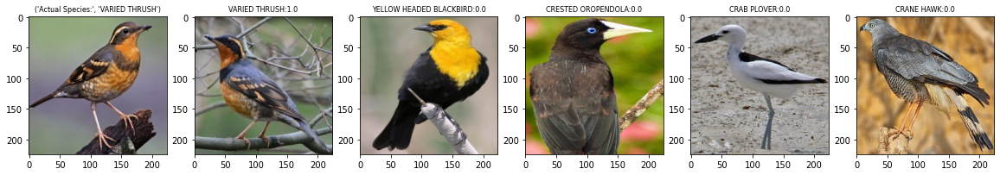

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-5/save_model/weights-33-0.8371.h5")

predict_bird_species(img_path="/content/test/VARIED THRUSH/3.jpg",img_width=224,img_height=224,
                     actual_species_name="VARIED THRUSH",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


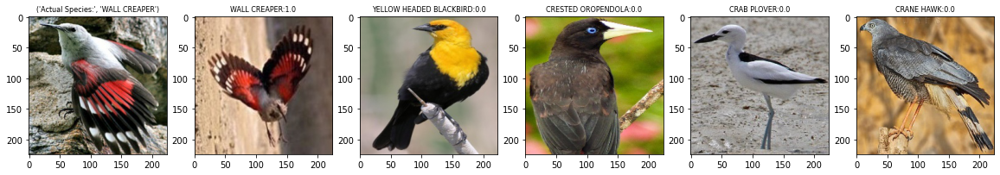

In [ ]:
predict_bird_species(img_path="/content/test/WALL CREAPER/3.jpg",img_width=224,img_height=224,
                     actual_species_name="WALL CREAPER",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


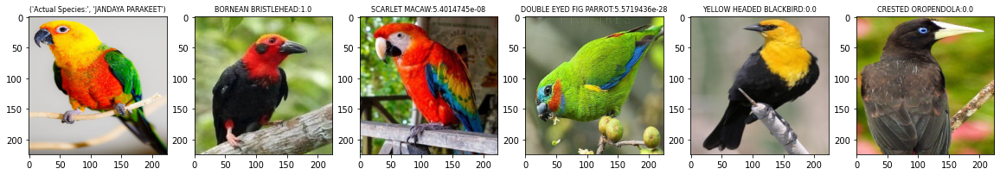

In [ ]:
predict_bird_species(img_path="/content/test/JANDAYA PARAKEET/2.jpg",img_width=224,img_height=224,
                     actual_species_name="JANDAYA PARAKEET",best_model=m,tf_lr=True,prep_func=vgg16_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-5/tblogs/"

                                                       Epoch Loss


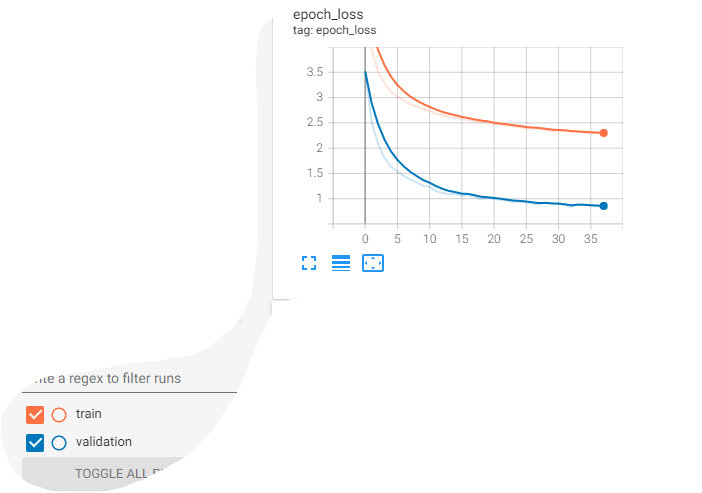

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-6</font></b>
* Trasfer Learning using ResNet50 (without its top layers)
* Transfer Learning for Fine-Tuning the entire network from scratch with ImageNet weights initialized & Adding my own classifier in the end
* Adam with very low Learning Rate = 0.0001 (so that the ImageNet weights don't get destroyed)
* Image dimensions: 224x224
* With Augmentation
* No Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=64
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=resnet_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,aug=True)
model_id="6"

# pre-trained model --> ResNet50
model = ResNet50(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3),pooling="avg")

# our new classifier starts here
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(model.layers[-1].output)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model6 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.0001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model6.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model6.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
913/913 [==============================] - ETA: 0s - loss: 3.4673
Epoch 1: val_loss improved from inf to 6.05960, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-6/save_model/weights-01-6.0596.h5
913/913 [==============================] - 869s 944ms/step - loss: 3.4673 - val_loss: 6.0596
Epoch 2/100
913/913 [==============================] - ETA: 0s - loss: 1.4241
Epoch 2: val_loss improved from 6.05960 to 2.13291, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-6/save_model/weights-02-2.1329.h5
913/913 [==============================] - 865s 948ms/step - loss: 1.4241 - val_loss: 2.1329
Epoch 3/100
913/913 [==============================] - ETA: 0s - loss: 1.0415
Epoch 3: val_loss improved from 2.13291 to 0.96656, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-6/save_model/weights-03-0.9666.h5
913/913 [=================

In [ ]:
model6.evaluate(test_it)

32/32 [==============================] - 5s 137ms/step - loss: 0.3604


0.3603949546813965

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


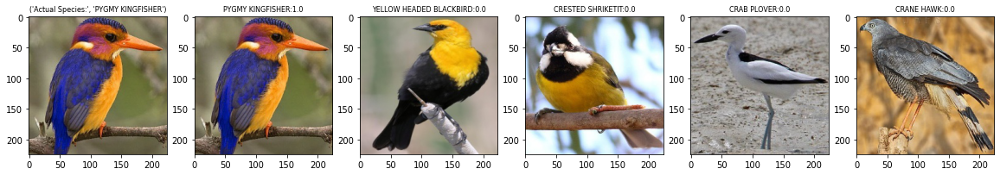

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-6/save_model/weights-07-0.2422.h5")

predict_bird_species(img_path="/content/test/PYGMY KINGFISHER/1.jpg",img_width=224,img_height=224,
                     actual_species_name="PYGMY KINGFISHER",best_model=m,tf_lr=True,prep_func=resnet_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


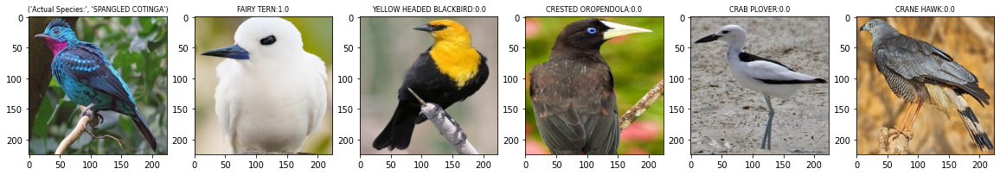

In [ ]:
predict_bird_species(img_path="/content/test/SPANGLED COTINGA/3.jpg",img_width=224,img_height=224,
                     actual_species_name="SPANGLED COTINGA",best_model=m,tf_lr=True,prep_func=resnet_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


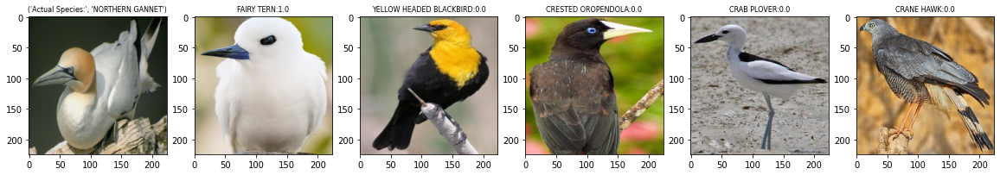

In [ ]:
predict_bird_species(img_path="/content/test/NORTHERN GANNET/2.jpg",img_width=224,img_height=224,
                     actual_species_name="NORTHERN GANNET",best_model=m,tf_lr=True,prep_func=resnet_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-6/tblogs/"

                                                       Epoch Loss


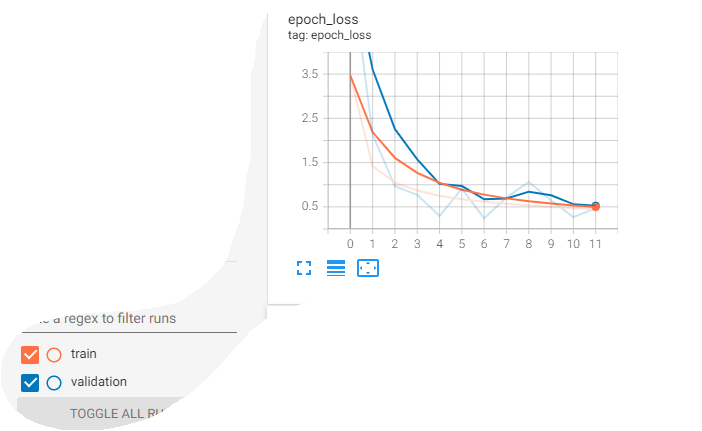

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-7</font></b>
* Trasfer Learning using EfficientNetB0 (without its top layers)
* Transfer Learning for Fine-Tuning the entire network from scratch with ImageNet weights initialized & Adding my own classifier in the end
* Adam with very low Learning Rate = 0.0001 (so that the ImageNet weights don't get destroyed)
* Image dimensions: 224x224
* No Augmentation
* No Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=64
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=eff_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height)
model_id="7"

# pre-trained model --> EfficientNetB0
model = EfficientNetB0(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3),pooling="avg")

# our new classifier starts here
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(model.layers[-1].output)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model7 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.0001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model7.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model7.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
913/913 [==============================] - ETA: 0s - loss: 3.5630
Epoch 1: val_loss improved from inf to 3.53775, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-7/save_model/weights-01-3.5377.h5
913/913 [==============================] - 406s 433ms/step - loss: 3.5630 - val_loss: 3.5377
Epoch 2/100
913/913 [==============================] - ETA: 0s - loss: 0.7465
Epoch 2: val_loss improved from 3.53775 to 1.02467, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-7/save_model/weights-02-1.0247.h5
913/913 [==============================] - 392s 429ms/step - loss: 0.7465 - val_loss: 1.0247
Epoch 3/100
913/913 [==============================] - ETA: 0s - loss: 0.3589
Epoch 3: val_loss did not improve from 1.02467
913/913 [==============================] - 392s 430ms/step - loss: 0.3589 - val_loss: 1.8411
Epoch 4/100
913/913 [==============================] - ETA: 0s - loss: 0

In [ ]:
print("Loss on Completely unseen test dataset:-")
model7.evaluate(test_it)

Loss on Completely unseen test dataset:-
32/32 [==============================] - 8s 135ms/step - loss: 0.8269


0.8268926739692688

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


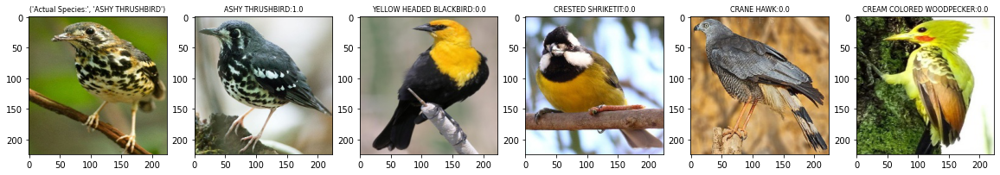

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-7/save_model/weights-05-0.8904.h5")

predict_bird_species(img_path="/content/test/ASHY THRUSHBIRD/2.jpg",img_width=224,img_height=224,
                     actual_species_name="ASHY THRUSHBIRD",best_model=m,tf_lr=True,prep_func=eff_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


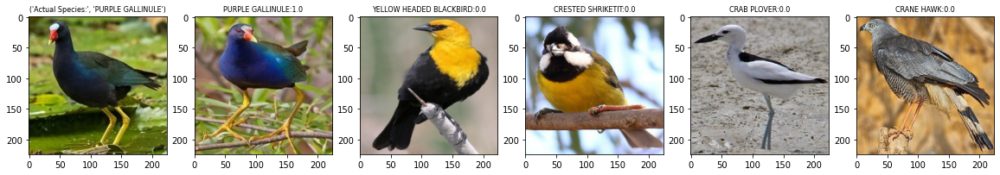

In [ ]:
predict_bird_species(img_path="/content/test/PURPLE GALLINULE/2.jpg",img_width=224,img_height=224,
                     actual_species_name="PURPLE GALLINULE",best_model=m,tf_lr=True,prep_func=eff_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


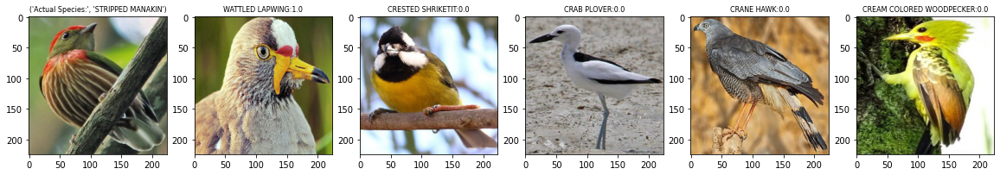

In [ ]:
predict_bird_species(img_path="/content/test/STRIPPED MANAKIN/2.jpg",img_width=224,img_height=224,
                     actual_species_name="STRIPPED MANAKIN",best_model=m,tf_lr=True,prep_func=eff_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-7/tblogs/"

                                                       Epoch Loss


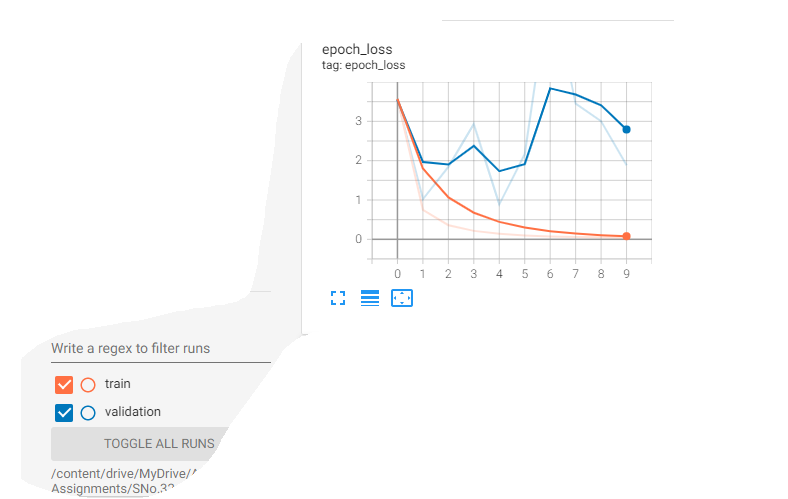

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-8</font></b>
* Trasfer Learning using InceptionV3 (without its top layers)
* Transfer Learning for Fine-Tuning the entire network from scratch with ImageNet weights initialized & Adding my own classifier in the end
* Adam with very low Learning Rate = 0.0001 (so that the ImageNet weights don't get destroyed)
* Image dimensions: 96x96
* With Augmentation
* No Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=96,96
BATCH_SIZE=64
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=incep_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,aug=True)
model_id="8"

# pre-trained model --> InceptionV3
model = InceptionV3(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3),pooling="avg")

# # our new classifier starts here
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(model.layers[-1].output)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model8 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.0001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model8.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model8.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
913/913 [==============================] - ETA: 0s - loss: 5.7895
Epoch 1: val_loss improved from inf to 4.81151, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-8/save_model/weights-01-4.8115.h5
913/913 [==============================] - 227s 241ms/step - loss: 5.7895 - val_loss: 4.8115
Epoch 2/100
913/913 [==============================] - ETA: 0s - loss: 4.2578
Epoch 2: val_loss improved from 4.81151 to 2.68565, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-8/save_model/weights-02-2.6856.h5
913/913 [==============================] - 218s 239ms/step - loss: 4.2578 - val_loss: 2.6856
Epoch 3/100
913/913 [==============================] - ETA: 0s - loss: 3.3127
Epoch 3: val_loss improved from 2.68565 to 2.13932, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-8/save_model/weights-03-2.1393.h5
913/913 [=================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model8.evaluate(test_it)

Loss on Completely unseen test dataset:-
32/32 [==============================] - 5s 96ms/step - loss: 0.3758


0.3757729232311249

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


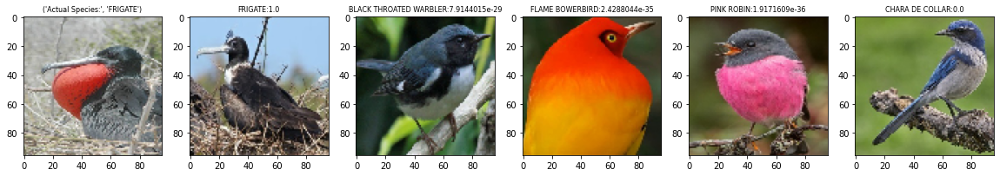

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-8/save_model/weights-28-0.4634.h5")

predict_bird_species(img_path="/content/test/FRIGATE/2.jpg",img_width=96,img_height=96,
                     actual_species_name="FRIGATE",best_model=m,tf_lr=True,prep_func=incep_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


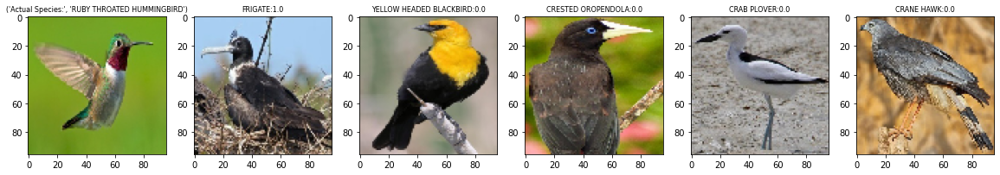

In [ ]:
predict_bird_species(img_path="/content/test/RUBY THROATED HUMMINGBIRD/2.jpg",img_width=96,img_height=96,
                     actual_species_name="RUBY THROATED HUMMINGBIRD",best_model=m,tf_lr=True,prep_func=incep_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


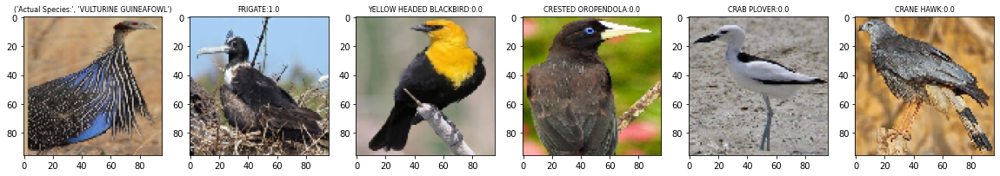

In [ ]:
predict_bird_species(img_path="/content/test/VULTURINE GUINEAFOWL/2.jpg",img_width=96,img_height=96,
                     actual_species_name="VULTURINE GUINEAFOWL",best_model=m,tf_lr=True,prep_func=incep_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-8/tblogs/"

                                                       Epoch Loss


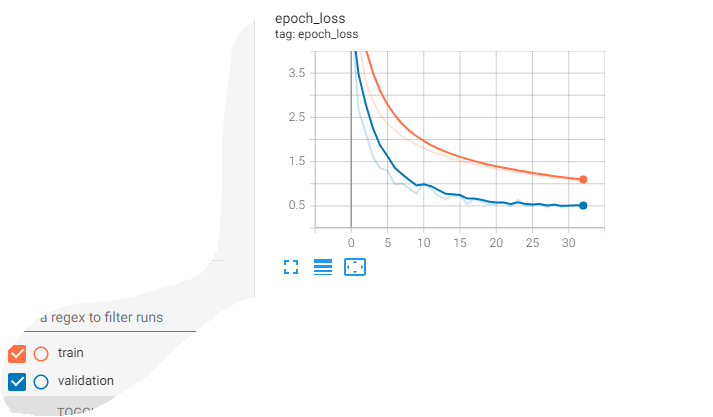

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-9</font></b>
* Trasfer Learning using VGG19 (without its top layers)
* Transfer Learning for Feature Extraction & Adding my own classifier in the end
* Adam with default Learning Rate = 0.001
* Image dimensions: 224x224
* With Augmentation
* No Dropout
* Flatten + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=256
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=vgg19_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,aug=True)
model_id="9"

# pre-trained model --> VGG19
model = VGG19(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3))
model.trainable = False

# our new classifier starts here
flat = Flatten()(model.layers[-1].output)
dense = Dense(units=1024,activation="relu",kernel_initializer="he_uniform")(flat)
dense = Dense(units=1024,activation="relu",kernel_initializer="he_uniform")(dense)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model9 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model9.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model9.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
229/229 [==============================] - ETA: 0s - loss: 5.4842
Epoch 1: val_loss improved from inf to 3.74347, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-9/save_model/weights-01-3.7435.h5
229/229 [==============================] - 768s 3s/step - loss: 5.4842 - val_loss: 3.7435
Epoch 2/100
229/229 [==============================] - ETA: 0s - loss: 4.1467
Epoch 2: val_loss improved from 3.74347 to 2.55196, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-9/save_model/weights-02-2.5520.h5
229/229 [==============================] - 757s 3s/step - loss: 4.1467 - val_loss: 2.5520
Epoch 3/100
229/229 [==============================] - ETA: 0s - loss: 3.7048
Epoch 3: val_loss improved from 2.55196 to 2.19315, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-9/save_model/weights-03-2.1931.h5
229/229 [=======================

In [ ]:
print("Loss on Completely unseen test dataset:-")
model9.evaluate(test_it)

Loss on Completely unseen test dataset:-
8/8 [==============================] - 26s 2s/step - loss: 1.1302


1.1301677227020264

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


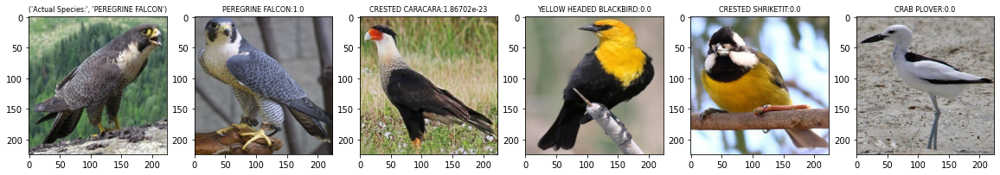

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-9/save_model/weights-23-1.2582.h5")

predict_bird_species(img_path="/content/test/PEREGRINE FALCON/3.jpg",img_width=224,img_height=224,
                     actual_species_name="PEREGRINE FALCON",best_model=m,tf_lr=True,prep_func=vgg19_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


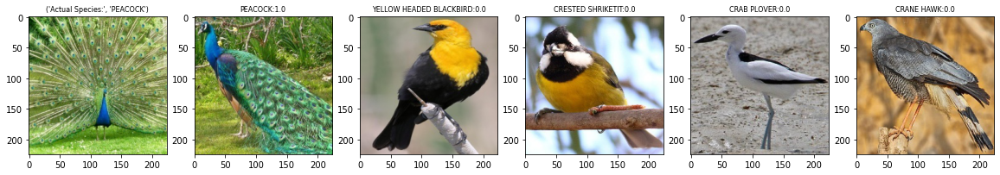

In [ ]:
predict_bird_species(img_path="/content/test/PEACOCK/5.jpg",img_width=224,img_height=224,
                     actual_species_name="PEACOCK",best_model=m,tf_lr=True,prep_func=vgg19_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


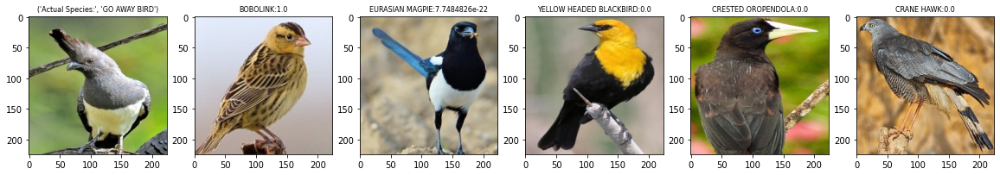

In [ ]:
predict_bird_species(img_path="/content/test/GO AWAY BIRD/1.jpg",img_width=224,img_height=224,
                     actual_species_name="GO AWAY BIRD",best_model=m,tf_lr=True,prep_func=vgg19_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-9/tblogs/"

                                                       Epoch Loss


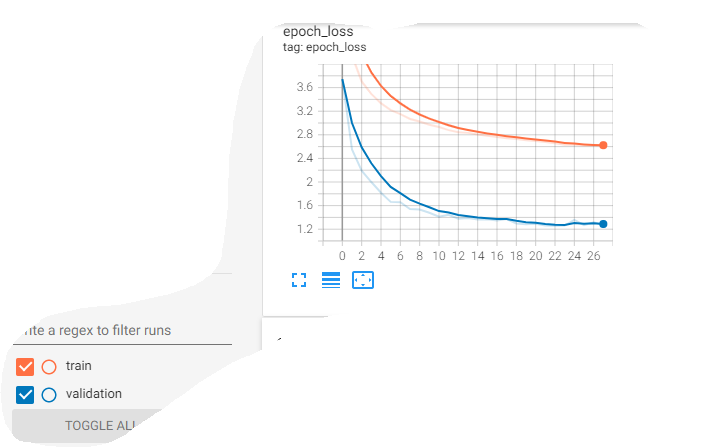

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-10</font></b>
* Trasfer Learning using VGG16 (without its top layers)
* Transfer Learning for Freezing the first 11 layers & Fine-Tuning the rest of the network  with ImageNet weights initialized & Adding my own classifier in the end
* Adam with very low Learning Rate = 0.0001 (so that the ImageNet weights don't get destroyed)
* Image dimensions: 224x224
* No Augmentation
* With Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=128
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=vgg16_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height)
model_id="10"

# pre-trained model --> VGG16
model = VGG16(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3),pooling="avg")
for layer in model.layers[:11]:
  layer.trainable = False

# # our new classifier starts here
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(model.layers[-1].output)
drp = Dropout(0.25)(dense)
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(drp)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model10 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.0001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model10.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model10.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
457/457 [==============================] - ETA: 0s - loss: 5.9831
Epoch 1: val_loss improved from inf to 5.92161, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-10/save_model/weights-01-5.9216.h5
457/457 [==============================] - 200s 425ms/step - loss: 5.9831 - val_loss: 5.9216
Epoch 2/100
457/457 [==============================] - ETA: 0s - loss: 5.7487
Epoch 2: val_loss improved from 5.92161 to 5.41392, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-10/save_model/weights-02-5.4139.h5
457/457 [==============================] - 192s 420ms/step - loss: 5.7487 - val_loss: 5.4139
Epoch 3/100
457/457 [==============================] - ETA: 0s - loss: 5.1012
Epoch 3: val_loss improved from 5.41392 to 4.16726, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-10/save_model/weights-03-4.1673.h5
457/457 [==============

In [ ]:
print("Loss on Completely unseen test dataset:-")
model10.evaluate(test_it)

Loss on Completely unseen test dataset:-
16/16 [==============================] - 12s 429ms/step - loss: 0.1857


0.18568699061870575

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


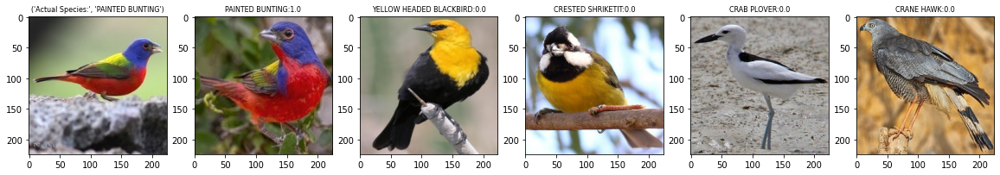

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-10/save_model/weights-15-0.3024.h5")

predict_bird_species(img_path="/content/test/PAINTED BUNTING/4.jpg",img_width=224,img_height=224,
                     actual_species_name="PAINTED BUNTING",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


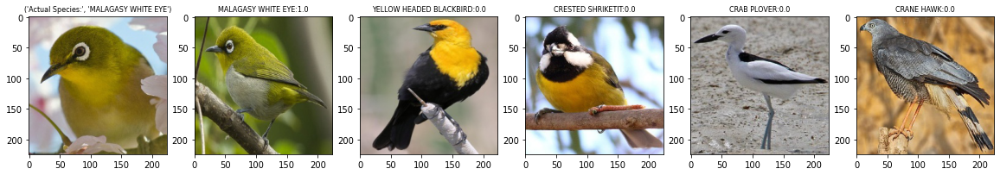

In [ ]:
predict_bird_species(img_path="/content/test/MALAGASY WHITE EYE/2.jpg",img_width=224,img_height=224,
                     actual_species_name="MALAGASY WHITE EYE",best_model=m,tf_lr=True,prep_func=vgg16_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


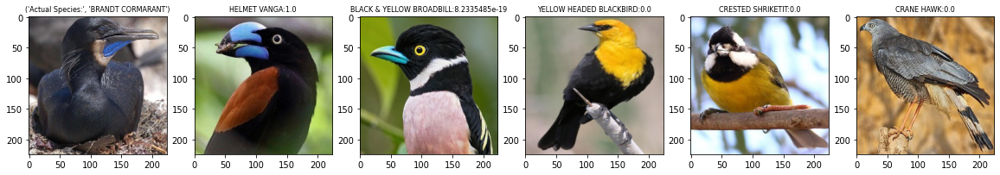

In [ ]:
predict_bird_species(img_path="/content/test/BRANDT CORMARANT/5.jpg",img_width=224,img_height=224,
                     actual_species_name="BRANDT CORMARANT",best_model=m,tf_lr=True,prep_func=vgg16_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-10/tblogs/"

                                                       Epoch Loss


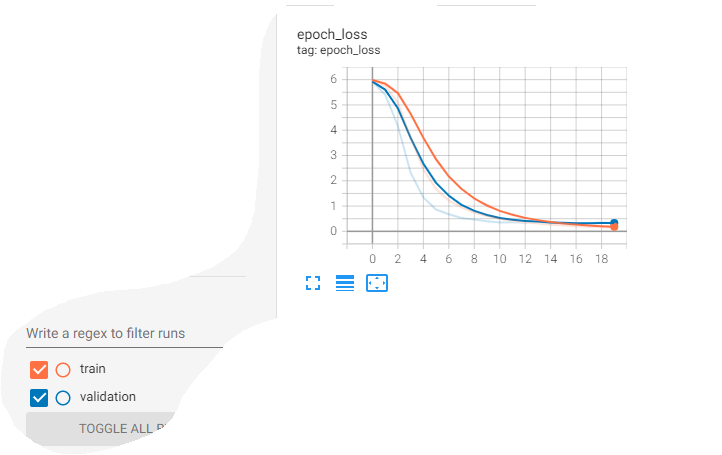

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

### <b><font color="#8fce00">Model-11</font></b>
* Trasfer Learning using VGG19 (without its top layers)
* Transfer Learning for Freezing the first 17 layers & Fine-Tuning the rest of the network  with ImageNet weights initialized & Adding my own classifier in the end
* Adam with very low Learning Rate = 0.0001 (so that the ImageNet weights don't get destroyed)
* Image dimensions: 224x224
* With Augmentation
* No Dropout
* GlobalAvgPool + Dense

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=224,224
BATCH_SIZE=64
train_it,validation_it,test_it = transfer_learning_iterator(prep_func=vgg19_prep,batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,aug=True)
model_id="11"

# pre-trained model --> VGG19
model = VGG19(include_top=False,weights="imagenet",input_shape=(img_width,img_height,3))
for layer in model.layers[:17]:
  layer.trainable = False

# our new classifier starts here
glob = GlobalAveragePooling2D()(model.layers[-2].output)
dense = Dense(units=128,activation="relu",kernel_initializer="he_normal")(glob)
dense = Dense(units=128,activation="relu",kernel_initializer="he_normal")(dense)
output_layer = Dense(units=400,activation="softmax",name="main_output_layer")(dense)

# final definition of our model
model11 = Model(inputs=model.inputs,outputs=output_layer)
opt = Adam(learning_rate=0.0001,beta_1=0.9,beta_2=0.999,epsilon=1e-07)
model11.compile(optimizer=opt,loss="categorical_crossentropy")

Found 2000 images belonging to 400 classes.
Found 2000 images belonging to 400 classes.
Found 58388 images belonging to 400 classes.


In [ ]:
print(train_it.class_indices)

{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'ALBATROSS': 7, 'ALBERTS TOWHEE': 8, 'ALEXANDRINE PARAKEET': 9, 'ALPINE CHOUGH': 10, 'ALTAMIRA YELLOWTHROAT': 11, 'AMERICAN AVOCET': 12, 'AMERICAN BITTERN': 13, 'AMERICAN COOT': 14, 'AMERICAN GOLDFINCH': 15, 'AMERICAN KESTREL': 16, 'AMERICAN PIPIT': 17, 'AMERICAN REDSTART': 18, 'AMETHYST WOODSTAR': 19, 'ANDEAN GOOSE': 20, 'ANDEAN LAPWING': 21, 'ANDEAN SISKIN': 22, 'ANHINGA': 23, 'ANIANIAU': 24, 'ANNAS HUMMINGBIRD': 25, 'ANTBIRD': 26, 'ANTILLEAN EUPHONIA': 27, 'APAPANE': 28, 'APOSTLEBIRD': 29, 'ARARIPE MANAKIN': 30, 'ASHY THRUSHBIRD': 31, 'ASIAN CRESTED IBIS': 32, 'AVADAVAT': 33, 'AZURE JAY': 34, 'AZURE TANAGER': 35, 'AZURE TIT': 36, 'BAIKAL TEAL': 37, 'BALD EAGLE': 38, 'BALD IBIS': 39, 'BALI STARLING': 40, 'BALTIMORE ORIOLE': 41, 'BANANAQUIT': 42, 'BAND TAILED GUAN': 43, 'BANDED BROADBILL': 44, 'BANDED 

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=5,verbose=1)

In [ ]:
%%time
set_random_seed(42)

history = model11.fit(train_it,steps_per_epoch=len(train_it),
                     validation_data=validation_it,validation_steps=len(validation_it),
                     epochs=100,callbacks=[cb1,cb2,cb3])

Epoch 1/100
913/913 [==============================] - ETA: 0s - loss: 5.8455
Epoch 1: val_loss improved from inf to 5.39628, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-11/save_model/weights-01-5.3963.h5
913/913 [==============================] - 778s 851ms/step - loss: 5.8455 - val_loss: 5.3963
Epoch 2/100
913/913 [==============================] - ETA: 0s - loss: 4.8577
Epoch 2: val_loss improved from 5.39628 to 3.60936, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-11/save_model/weights-02-3.6094.h5
913/913 [==============================] - 760s 833ms/step - loss: 4.8577 - val_loss: 3.6094
Epoch 3/100
913/913 [==============================] - ETA: 0s - loss: 3.7160
Epoch 3: val_loss improved from 3.60936 to 2.55416, saving model to /content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-11/save_model/weights-03-2.5542.h5
913/913 [==============

In [ ]:
print("Loss on Completely unseen test dataset:-")
model11.evaluate(test_it)

Loss on Completely unseen test dataset:-
32/32 [==============================] - 9s 186ms/step - loss: 0.1426


0.14261622726917267

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


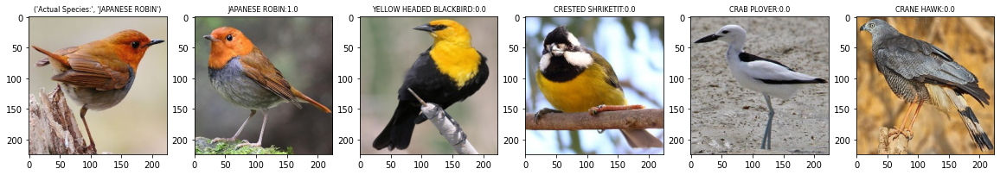

In [ ]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-11/save_model/weights-55-0.2253.h5")

predict_bird_species(img_path="/content/test/JAPANESE ROBIN/2.jpg",img_width=224,img_height=224,
                     actual_species_name="JAPANESE ROBIN",best_model=m,tf_lr=True,prep_func=vgg19_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


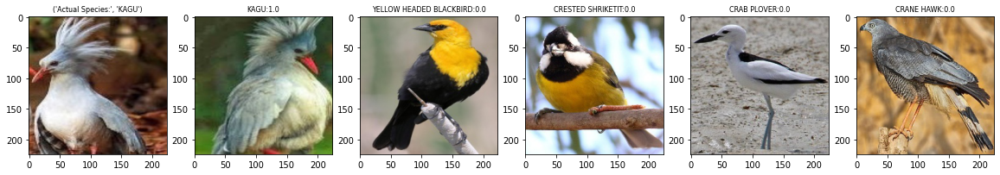

In [ ]:
predict_bird_species(img_path="/content/test/KAGU/4.jpg",img_width=224,img_height=224,
                     actual_species_name="KAGU",best_model=m,tf_lr=True,prep_func=vgg19_prep)

Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


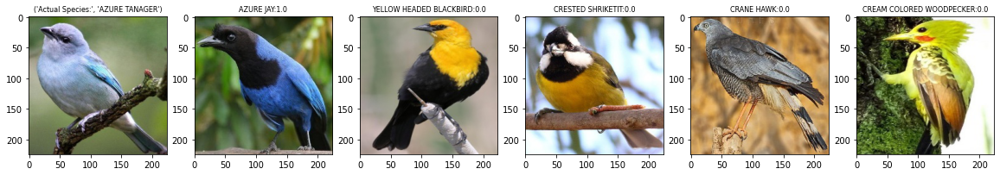

In [ ]:
predict_bird_species(img_path="/content/test/AZURE TANAGER/5.jpg",img_width=224,img_height=224,
                     actual_species_name="AZURE TANAGER",best_model=m,tf_lr=True,prep_func=vgg19_prep)

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-11/tblogs/"

                                                       Epoch Loss


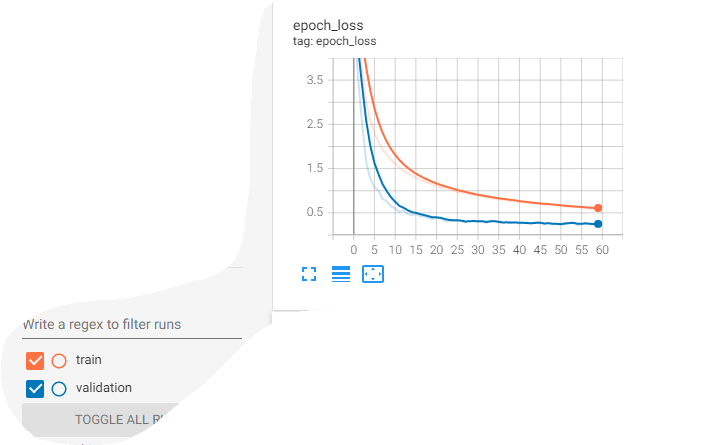

In [ ]:
print("                                                       Epoch Loss")
img = cv2.imread('loss.PNG')
cv2_imshow(img)

# <font color="#1b5776"><u>7. Summary</u></font>

In [ ]:
x = PrettyTable(["Model Architecture","Lowest Train Loss","Lowest Validation Loss","Lowest Loss on Completely Unseen Test Data"])
x.add_row([" Model-1","3.0587","3.3087","3.2695"])
x.add_row([" Model-2","2.9899","2.2306","2.0766"])
x.add_row([" Model-3","2.0990","1.2643","1.164"])
x.add_row([" Model-4","1.2103","0.9423","0.8806"])
x.add_row([" Model-5","2.3167","0.8371","0.7186"])
x.add_row([" Model-6","0.6185","0.2422","0.3603"])
x.add_row([" Model-7","0.1417","0.8904","0.8268"])
x.add_row([" Model-8","1.1626","0.4634","0.3757"])
x.add_row([" Model-9","2.6555","1.2582","1.1301"])
x.add_row([" Model-10","0.3516","0.3417","0.1856"])
x.add_row([" Model-11","0.6244","0.2253","0.1426"])
print(x)

+--------------------+-------------------+------------------------+--------------------------------------------+
| Model Architecture | Lowest Train Loss | Lowest Validation Loss | Lowest Loss on Completely Unseen Test Data |
+--------------------+-------------------+------------------------+--------------------------------------------+
|       Model-1      |       3.0587      |         3.3087         |                   3.2695                   |
|       Model-2      |       2.9899      |         2.2306         |                   2.0766                   |
|       Model-3      |       2.0990      |         1.2643         |                   1.164                    |
|       Model-4      |       1.2103      |         0.9423         |                   0.8806                   |
|       Model-5      |       2.3167      |         0.8371         |                   0.7186                   |
|       Model-6      |       0.6185      |         0.2422         |                   0.3603    

<font color="red">CONCLUSION</font>: The best model which classified the 400 species with lowest loss is  Model-11: Fine-Tuning of VGG19 via Transfer Learning Approach : 1st 17 layers were left as is (by not updating their weights). The top classifier wasn't included. The last layer was then attached with a GlobalAveragePooling layer followed by 2 dense layers as my own classifier.

# <font color="#1b5776"><u>References</u></font>

In [ ]:
# DISPLAY MATPLOTIB IMSHOW IMAGES
# https://stackoverflow.com/questions/49643907/clipping-input-data-to-the-valid-range-for-imshow-with-rgb-data-0-1-for-floa
# https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.imshow.html
# https://www.google.com/search?q=astype(%27uint8%27)&rlz=1C1UEAD_enIN959IN959&oq=astype(%27uint8%27)&aqs=chrome..69i57j0i30j0i5i30.544j0j4&sourceid=chrome&ie=UTF-8#:~:text=What%20is%20uint8,values%200..%20255

# AGUMENTATION
# https://stackoverflow.com/questions/54702212/keras-rescale-1-255-vs-preprocessing-function-preprocess-input-which-one-to

# (DEPTHWISE)SEAPARABLE CONV
# https://github.com/christianversloot/machine-learning-articles/blob/main/creating-depthwise-separable-convolutions-in-keras.md
# https://www.tensorflow.org/api_docs/python/tf/keras/layers/SeparableConv2D